In [ ]:
!pip install datasets transformers attrdict

     |████████████████████████████████| 225kB 12.0MB/s 
     |████████████████████████████████| 2.1MB 35.4MB/s 
     |████████████████████████████████| 245kB 44.2MB/s 
     |████████████████████████████████| 112kB 50.9MB/s 
     |████████████████████████████████| 901kB 47.3MB/s 
     |████████████████████████████████| 3.3MB 45.7MB/s 


In [ ]:
!nvidia-smi

Tue May 11 02:06:24 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.19.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
path_prefix = '/content/gdrive/MyDrive/11747/GoEmotions-pytorch-multitask'

In [ ]:
import torch
import torch.nn as nn
from transformers import BertPreTrainedModel, BertModel
from transformers import BertTokenizer
from typing import Union, Optional
from torch.utils.data import SequentialSampler, DataLoader

import numpy as np
import pandas as pd
import seaborn as sns
from transformers.pipelines import ArgumentHandler
from transformers import (
    Pipeline,
    PreTrainedTokenizer,
    ModelCard
)
from pprint import pprint
import os
import google.colab as colab
import pandas as pd
import json
from sklearn.metrics import multilabel_confusion_matrix
import matplotlib.pyplot as plt
from attrdict import AttrDict
from tqdm.notebook import tqdm

# Load Data

In [ ]:
import sys
sys.path.insert(1, path_prefix)
import importlib

In [ ]:
from data_loader import *
from run_goemotions import *

In [ ]:
def main(taxonomy):
    # Read from config file and make args
    config_filename = "{}.json".format(taxonomy)
    with open(os.path.join(path_prefix+"/config", config_filename)) as f:
        args = AttrDict(json.load(f))
    logger.info("Training/evaluation parameters {}".format(args))

    args.output_dir = os.path.join(args.ckpt_dir, args.output_dir)

    init_logger()
    set_seed(args)

    processor = GoEmotionsProcessor(args)
    label_list = processor.get_labels()

    config = BertConfig.from_pretrained(
        args.model_name_or_path,
        num_labels=len(label_list),
        finetuning_task=args.task,
        id2label={str(i): label for i, label in enumerate(label_list)},
        label2id={label: i for i, label in enumerate(label_list)}
    )
    tokenizer = BertTokenizer.from_pretrained(
        args.tokenizer_name_or_path,
    )
    model = BertForMultiLabelClassification.from_pretrained(
        args.model_name_or_path,
        config=config
    )

    # GPU or CPU
    args.device = "cuda" if torch.cuda.is_available() and not args.no_cuda else "cpu"
    model.to(args.device)

    # Load dataset
    train_dataset = load_and_cache_examples(args, tokenizer, mode="train") if args.train_file else None
    dev_dataset = load_and_cache_examples(args, tokenizer, mode="dev") if args.dev_file else None
    test_dataset = load_and_cache_examples(args, tokenizer, mode="test") if args.test_file else None
    return train_dataset, dev_dataset, test_dataset, tokenizer, processor

    # if dev_dataset is None:
    #     args.evaluate_test_during_training = True  # If there is no dev dataset, only use test dataset

    # if args.do_train:
    #     global_step, tr_loss = train(args, model, tokenizer, train_dataset, dev_dataset, test_dataset)
    #     logger.info(" global_step = {}, average loss = {}".format(global_step, tr_loss))

    # results = {}
    # if args.do_eval:
    #     checkpoints = list(
    #         os.path.dirname(c) for c in sorted(glob.glob(args.output_dir + "/**/" + "pytorch_model.bin", recursive=True))
    #     )
    #     if not args.eval_all_checkpoints:
    #         checkpoints = checkpoints[-1:]
    #     else:
    #         logging.getLogger("transformers.configuration_utils").setLevel(logging.WARN)  # Reduce logging
    #         logging.getLogger("transformers.modeling_utils").setLevel(logging.WARN)  # Reduce logging
    #     logger.info("Evaluate the following checkpoints: %s", checkpoints)
    #     for checkpoint in checkpoints:
    #         global_step = checkpoint.split("-")[-1]
    #         model = BertForMultiLabelClassification.from_pretrained(checkpoint)
    #         model.to(args.device)
    #         result = evaluate(args, model, test_dataset, mode="test", global_step=global_step)
    #         result = dict((k + "_{}".format(global_step), v) for k, v in result.items())
    #         results.update(result)

    #     output_eval_file = os.path.join(args.output_dir, "eval_results.txt")
    #     with open(output_eval_file, "w") as f_w:
    #         for key in sorted(results.keys()):
    #             f_w.write("{} = {}\n".format(key, str(results[key])))

In [ ]:
!rm /content/gdrive/MyDrive/11747/GoEmotions-pytorch/data/original/cached_goemotions_bert-base-cased_50_dev
!rm /content/gdrive/MyDrive/11747/GoEmotions-pytorch/data/original/cached_goemotions_bert-base-cased_50_test
!rm /content/gdrive/MyDrive/11747/GoEmotions-pytorch/data/original/cached_goemotions_bert-base-cased_50_train

In [ ]:
train_dataset, dev_dataset, test_dataset, tokenizer, processor = main("multitask")

05/08/2021 00:51:16 - INFO - run_goemotions -   Training/evaluation parameters AttrDict({'task': 'goemotions', 'data_dir': '/content/gdrive/MyDrive/11747/GoEmotions-pytorch-multitask/data/multitask', 'ckpt_dir': '/content/gdrive/MyDrive/11747/GoEmotions-pytorch-multitask/ckpt/multitask', 'output_dir': 'bert-base-cased-goemotions-multitask', 'train_file': 'train.tsv', 'dev_file': 'dev.tsv', 'test_file': 'test.tsv', 'subtask_label_file': 'subtask-labels.txt', 'label_file': 'labels.txt', 'evaluate_test_during_training': False, 'eval_all_checkpoints': True, 'save_optimizer': False, 'do_lower_case': False, 'do_train': True, 'do_eval': True, 'max_seq_len': 50, 'num_train_epochs': 4, 'weight_decay': 0.0, 'gradient_accumulation_steps': 1, 'adam_epsilon': 1e-08, 'warmup_proportion': 0.1, 'max_steps': -1, 'max_grad_norm': 1.0, 'no_cuda': False, 'model_type': 'bert', 'model_name_or_path': 'bert-base-cased', 'tokenizer_name_or_path': 'monologg/bert-base-cased-goemotions-original', 'seed': 42, 'tra

05/08/2021 00:51:17 - INFO - filelock -   Lock 139773527240336 released on /root/.cache/huggingface/transformers/a803e0468a8fe090683bdc453f4fac622804f49de86d7cecaee92365d4a0f829.a64a22196690e0e82ead56f388a3ef3a50de93335926ccfa20610217db589307.lock
05/08/2021 00:51:17 - INFO - filelock -   Lock 139773527501904 acquired on /root/.cache/huggingface/transformers/455abd97bdf3d4acd7d16e7ff15543ea8108d50a94d030a5487c8f27f59d8fb1.133d4cc7222b56c4682511b72e35fbcad84cebb6fe95754faaa00d1521567c14.lock


05/08/2021 00:51:17 - INFO - filelock -   Lock 139773527501904 released on /root/.cache/huggingface/transformers/455abd97bdf3d4acd7d16e7ff15543ea8108d50a94d030a5487c8f27f59d8fb1.133d4cc7222b56c4682511b72e35fbcad84cebb6fe95754faaa00d1521567c14.lock
05/08/2021 00:51:17 - INFO - filelock -   Lock 139773527500944 acquired on /root/.cache/huggingface/transformers/5cd3439c42a327418ca2989891c4b56d795c58d9f60a22b31f0d834c0d773de6.5cc2dd391651ee3343d5311f41978d21c29a0a52c93d158dbfbc1d04b5f4731a.lock


05/08/2021 00:51:17 - INFO - filelock -   Lock 139773527500944 released on /root/.cache/huggingface/transformers/5cd3439c42a327418ca2989891c4b56d795c58d9f60a22b31f0d834c0d773de6.5cc2dd391651ee3343d5311f41978d21c29a0a52c93d158dbfbc1d04b5f4731a.lock
05/08/2021 00:51:17 - INFO - filelock -   Lock 139773527538576 acquired on /root/.cache/huggingface/transformers/28ea0b02a2b3426f3635601308db2766d00abf2427712b88886ce770c19e3951.37cb83bfe7666f9d6d237a371b239684ed63eb83e15dab2e8b2c7ba324c70cc7.lock


05/08/2021 00:51:18 - INFO - filelock -   Lock 139773527538576 released on /root/.cache/huggingface/transformers/28ea0b02a2b3426f3635601308db2766d00abf2427712b88886ce770c19e3951.37cb83bfe7666f9d6d237a371b239684ed63eb83e15dab2e8b2c7ba324c70cc7.lock


05/08/2021 00:51:18 - INFO - filelock -   Lock 139773527771920 acquired on /root/.cache/huggingface/transformers/092cc582560fc3833e556b3f833695c26343cb54b7e88cd02d40821462a74999.1f48cab6c959fc6c360d22bea39d06959e90f5b002e77e836d2da45464875cda.lock


05/08/2021 00:51:38 - INFO - filelock -   Lock 139773527771920 released on /root/.cache/huggingface/transformers/092cc582560fc3833e556b3f833695c26343cb54b7e88cd02d40821462a74999.1f48cab6c959fc6c360d22bea39d06959e90f5b002e77e836d2da45464875cda.lock


Some weights of the model checkpoint at bert-base-cased were not used when initializing BertForMultiLabelClassification: ['cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing BertForMultiLabelClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMultiLabelClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForMultiLabelClassification were not initialized from the model checkpo

In [ ]:
train_loader = DataLoader(train_dataset, batch_size=2, pin_memory=True)

In [ ]:
for d in train_loader:
    # print(d)
    break

In [ ]:
tokenizer.decode(d[0][0])

"[CLS] admiration amusement anger annoyance approval caring confusion curiosity desire disappointment disapproval disgust embarrassment excitement fear gratitude grief joy love nervous optimistic pride realization relief remorse sadness surprise neutral [SEP] My favourite food is anything I didn't have to cook myself. [SEP] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD] [PAD]"

In [ ]:
tokenizer.tokenize("admiration amusement anger annoyance approval caring confusion curiosity desire disappointment disapproval disgust embarrassment excitement fear gratitude grief joy love nervous optimistic pride realization relief remorse sadness surprise neutral")

['admiration',
 'amusement',
 'anger',
 'annoyance',
 'approval',
 'caring',
 'confusion',
 'curiosity',
 'desire',
 'disappointment',
 'disapproval',
 'disgust',
 'embarrassment',
 'excitement',
 'fear',
 'gratitude',
 'grief',
 'joy',
 'love',
 'nervous',
 'optimistic',
 'pride',
 'realization',
 'relief',
 'remorse',
 'sadness',
 'surprise',
 'neutral']

# Train

In [ ]:
!cd /content/gdrive/MyDrive/11747/GoEmotions-pytorch-attention && python3 run_goemotions.py --taxonomy original # epoch=10

2021-05-08 18:29:31.552583: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.11.0
Some weights of the model checkpoint at bert-base-cased were not used when initializing BertForMultiLabelClassification: ['cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing BertForMultiLabelClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMultiLabelClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassificat

In [ ]:
!cd /content/gdrive/MyDrive/11747/GoEmotions-pytorch-multitask && python3 run_goemotions.py --taxonomy multitask # alpha=0.8, epoch=10

Streaming output truncated to the last 5000 lines.
Iteration:  60% 1620/2714 [04:57<02:55,  6.23it/s]
Iteration:  60% 1621/2714 [04:58<02:55,  6.24it/s]
Iteration:  60% 1622/2714 [04:58<02:56,  6.18it/s]
Iteration:  60% 1623/2714 [04:58<02:56,  6.17it/s]
Iteration:  60% 1624/2714 [04:58<02:57,  6.14it/s]
Iteration:  60% 1625/2714 [04:58<02:56,  6.16it/s]
Iteration:  60% 1626/2714 [04:58<02:56,  6.16it/s]
Iteration:  60% 1627/2714 [04:59<02:55,  6.20it/s]
Iteration:  60% 1628/2714 [04:59<02:54,  6.23it/s]
Iteration:  60% 1629/2714 [04:59<02:54,  6.21it/s]
Iteration:  60% 1630/2714 [04:59<02:54,  6.23it/s]
Iteration:  60% 1631/2714 [04:59<02:54,  6.22it/s]
Iteration:  60% 1632/2714 [04:59<02:53,  6.23it/s]
Iteration:  60% 1633/2714 [05:00<02:54,  6.18it/s]
Iteration:  60% 1634/2714 [05:00<02:55,  6.16it/s]
Iteration:  60% 1635/2714 [05:00<02:53,  6.21it/s]
Iteration:  60% 1636/2714 [05:00<02:52,  6.24it/s]
Iteration:  60% 1637/2714 [05:00<02:52,  6.23it/s]
Iteration:  60% 1638/2714 [05:0

In [ ]:
!cd /content/gdrive/MyDrive/11747/GoEmotions-pytorch-multitask && python3 run_goemotions.py --taxonomy multitask # alpha=0.9, epochs=10

Streaming output truncated to the last 5000 lines.
Iteration:  60% 1620/2714 [04:57<02:57,  6.15it/s]
Iteration:  60% 1621/2714 [04:57<02:56,  6.18it/s]
Iteration:  60% 1622/2714 [04:57<02:56,  6.19it/s]
Iteration:  60% 1623/2714 [04:58<02:55,  6.21it/s]
Iteration:  60% 1624/2714 [04:58<02:55,  6.20it/s]
Iteration:  60% 1625/2714 [04:58<02:56,  6.18it/s]
Iteration:  60% 1626/2714 [04:58<02:54,  6.24it/s]
Iteration:  60% 1627/2714 [04:58<02:55,  6.19it/s]
Iteration:  60% 1628/2714 [04:58<02:54,  6.21it/s]
Iteration:  60% 1629/2714 [04:59<02:56,  6.16it/s]
Iteration:  60% 1630/2714 [04:59<02:55,  6.18it/s]
Iteration:  60% 1631/2714 [04:59<02:54,  6.21it/s]
Iteration:  60% 1632/2714 [04:59<02:53,  6.24it/s]
Iteration:  60% 1633/2714 [04:59<02:53,  6.25it/s]
Iteration:  60% 1634/2714 [04:59<02:52,  6.28it/s]
Iteration:  60% 1635/2714 [05:00<02:53,  6.24it/s]
Iteration:  60% 1636/2714 [05:00<02:53,  6.20it/s]
Iteration:  60% 1637/2714 [05:00<02:54,  6.16it/s]
Iteration:  60% 1638/2714 [05:0

In [ ]:
!cd /content/gdrive/MyDrive/11747/GoEmotions-pytorch-multitask-setting2 && python3 run_goemotions.py --taxonomy multitask

Streaming output truncated to the last 5000 lines.
Iteration:  50% 1348/2714 [03:51<03:39,  6.23it/s]
Iteration:  50% 1349/2714 [03:51<03:38,  6.24it/s]
Iteration:  50% 1350/2714 [03:51<03:39,  6.22it/s]
Iteration:  50% 1351/2714 [03:52<03:37,  6.26it/s]
Iteration:  50% 1352/2714 [03:52<03:37,  6.27it/s]
Iteration:  50% 1353/2714 [03:52<03:36,  6.28it/s]
Iteration:  50% 1354/2714 [03:52<03:36,  6.27it/s]
Iteration:  50% 1355/2714 [03:52<03:40,  6.16it/s]
Iteration:  50% 1356/2714 [03:52<03:39,  6.19it/s]
Iteration:  50% 1357/2714 [03:53<03:39,  6.17it/s]
Iteration:  50% 1358/2714 [03:53<03:40,  6.16it/s]
Iteration:  50% 1359/2714 [03:53<03:38,  6.19it/s]
Iteration:  50% 1360/2714 [03:53<03:37,  6.23it/s]
Iteration:  50% 1361/2714 [03:53<03:35,  6.26it/s]
Iteration:  50% 1362/2714 [03:53<03:34,  6.29it/s]
Iteration:  50% 1363/2714 [03:54<03:33,  6.33it/s]
Iteration:  50% 1364/2714 [03:54<03:32,  6.34it/s]
Iteration:  50% 1365/2714 [03:54<03:32,  6.34it/s]
Iteration:  50% 1366/2714 [03:5

# Inference

Best model: checkpoint-8000

In [ ]:
path_prefix = '/content/gdrive/MyDrive/11747/GoEmotions-pytorch-attention'
original_path_prefix = '/content/gdrive/MyDrive/11747/GoEmotions-pytorch'

In [ ]:
import sys
sys.path.insert(1, path_prefix)
import importlib
from data_loader import *

In [ ]:
CHECKPOINT_ROOT = path_prefix + "/ckpt/original/bert-base-cased-goemotions-original/checkpoint-8000"
ORIGINAL_CKPT_ROOT = original_path_prefix + "/ckpt/original/bert-base-cased-goemotions-original/checkpoint-26000"

In [ ]:
class OriginalBertForMultiLabelClassification(BertPreTrainedModel):
    def __init__(self, config):
        config.output_attentions = True
        super().__init__(config)
        self.num_labels = config.num_labels

        self.bert = BertModel(config)
        self.dropout = nn.Dropout(config.hidden_dropout_prob)
        self.classifier = nn.Linear(config.hidden_size, self.config.num_labels)
        self.loss_fct = nn.BCEWithLogitsLoss()

        self.init_weights()

    def forward(
            self,
            input_ids=None,
            attention_mask=None,
            token_type_ids=None,
            position_ids=None,
            head_mask=None,
            inputs_embeds=None,
            labels=None,
    ):
        outputs = self.bert(
            input_ids,
            attention_mask=attention_mask,
            token_type_ids=token_type_ids,
            position_ids=position_ids,
            head_mask=head_mask,
            inputs_embeds=inputs_embeds
        )
        pooled_output = outputs[1]

        pooled_output = self.dropout(pooled_output)
        logits = self.classifier(pooled_output)

        outputs = (logits,) + outputs[2:]  # add hidden states and attention if they are here

        if labels is not None:
            loss = self.loss_fct(logits, labels)
            outputs = (loss,) + outputs

        return outputs  # (loss), logits, (hidden_states), (attentions)

In [ ]:
class BertForMultiLabelClassification(BertPreTrainedModel):
    def __init__(self, config):
        config.output_attentions = True
        super().__init__(config)
        self.num_labels = config.num_labels

        self.bert = BertModel(config)
        self.pool_classifier = nn.Sequential(
            nn.Linear(config.hidden_size, config.hidden_size),
            nn.Tanh(),
            nn.Dropout(config.hidden_dropout_prob),
            nn.Linear(config.hidden_size, 1)
        )
        # self.dropout = nn.Dropout(config.hidden_dropout_prob)
        # self.classifier = nn.Linear(config.hidden_size, self.config.num_labels)
        self.loss_fct = nn.BCEWithLogitsLoss()

        self.init_weights()

    def forward(
            self,
            input_ids=None,
            attention_mask=None,
            token_type_ids=None,
            position_ids=None,
            head_mask=None,
            inputs_embeds=None,
            labels=None,
    ):
        outputs = self.bert(
            input_ids,
            attention_mask=attention_mask,
            token_type_ids=token_type_ids,
            position_ids=position_ids,
            head_mask=head_mask,
            inputs_embeds=inputs_embeds,
        )

        last_hidden_state = outputs[0][:, 1:self.config.num_labels+1] # only get the states corresponding to labels

        logits = self.pool_classifier(last_hidden_state).squeeze(-1)

        # pooled_output = outputs[1]
        # pooled_output = self.dropout(pooled_output)
        # logits = self.classifier(pooled_output)

        outputs = (logits,) + outputs[2:]  # add hidden states and attention if they are here

        if labels is not None:
            loss = self.loss_fct(logits, labels)
            outputs = (loss,) + outputs

        return outputs  # (loss), logits, (hidden_states), (attentions)

In [ ]:
%cd /content/gdrive/MyDrive/11747/GoEmotions-pytorch-attention
%pwd

/content/gdrive/MyDrive/11747/GoEmotions-pytorch-attention


'/content/gdrive/MyDrive/11747/GoEmotions-pytorch-attention'

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

def baseline_goemotions(texts, tokenizer, model, threshold=0.3):
  # torch.cuda.set_device(device)
  # 1. Tokenizer pass for both test inputs and candidate inputs
  model.eval()
  inputs = tokenizer(
            texts,
            add_special_tokens=True,
            return_tensors="pt",
            padding=True,
            truncation=False,
        )
  with torch.no_grad():
    # 2. Model Forward pass
    inputs = {name: tensor.to(device) for name, tensor in inputs.items()}
    # outputs = model(**inputs)[0].cpu()
    outputs = model(input_ids=inputs["input_ids"],
                    attention_mask=inputs["attention_mask"],
                    token_type_ids=inputs["token_type_ids"])[0].cpu()
    # 3. Inference output post-processing
    scores = 1 / (1 + np.exp(-outputs))  # Sigmoid
    results = []
    for item in scores:
        labels = []
        scores = []
        for idx, s in enumerate(item):
            if s > threshold:
                labels.append(model.config.id2label[idx])
                scores.append(float(s))
        results.append({"labels": labels, "scores": scores})
    return results

def get_baseline_results(taxonomy, tokenizer, model, ROOT_DIR='/content/gdrive/MyDrive/11747/GoEmotions-pytorch/'):
  df = pd.read_csv(ROOT_DIR + f"data/{taxonomy}/test.tsv", sep='\t', header=None, names=["sentence", "label", "encoding"])
  sentences = df.sentence.tolist()
  ground_truths = []
  for x in df.label.tolist():
    single_idxs = x.split(",")
    single_labels = []
    for label in single_idxs:
      single_labels.append(model.config.id2label[int(label)])
    ground_truths.append(single_labels)
  
  raw_predictions = []
  batch_size = 81
  num_batches = len(sentences) / batch_size

  model.to(device)

  i = 0
  while i < len(sentences):
    raw_predictions += baseline_goemotions(sentences[i: i + batch_size], tokenizer, model)
    i = i + batch_size
  return raw_predictions, ground_truths

In [ ]:
class MultiLabelTestInferencePipeline(Pipeline):
    def __init__(
            self,
            model: Union["PreTrainedModel", "TFPreTrainedModel"],
            tokenizer: PreTrainedTokenizer,
            modelcard: Optional[ModelCard] = None,
            framework: Optional[str] = None,
            task: str = "",
            args_parser: ArgumentHandler = None,
            device: int = -1,
            binary_output: bool = False,
            threshold: float = 0.3,
            taxonomy = "original"
    ):
        super().__init__(
            model=model,
            tokenizer=tokenizer,
            modelcard=modelcard,
            framework=framework,
            args_parser=args_parser,
            device=device,
            binary_output=binary_output,
            task=task
        )

        self.threshold = threshold

        config_filename = "{}.json".format(taxonomy)
        with open(os.path.join("config", config_filename)) as f:
            args = AttrDict(json.load(f))

        args.output_dir = os.path.join(args.ckpt_dir, args.output_dir)

        processor = GoEmotionsProcessor(args)
        label_list = processor.get_labels()

        args.device = "cuda" if torch.cuda.is_available() and not args.no_cuda else "cpu"
        model.to(args.device)

        eval_dataset = load_and_cache_examples(args, tokenizer, mode="test") if args.test_file else None
        eval_sampler = SequentialSampler(eval_dataset)
        self.eval_dataloader = DataLoader(eval_dataset, sampler=eval_sampler, batch_size=args.eval_batch_size)

        self.args = args
        self.model = model

    def __call__(self, *args, **kwargs):

        results = []
        ground_truths = []
        for batch in tqdm(self.eval_dataloader):
            self.model.eval()
            for label in batch[3]:
                label_text = []
                idxs = np.where(label.numpy() == 1.0)[0]
                for idx in idxs:
                    label_text.append(self.model.config.id2label[idx])
                ground_truths.append(label_text)
            
            batch = tuple(t.to(self.args.device) for t in batch)

            with torch.no_grad():
                inputs = {
                    "input_ids": batch[0],
                    "attention_mask": batch[1],
                    "token_type_ids": batch[2],
                    "labels": batch[3]
                }
                outputs = self.model(**inputs)[1].detach().cpu()

            scores = 1 / (1 + np.exp(-outputs))  # Sigmoid
            for item in scores:
                labels = []
                scores = []
                for idx, s in enumerate(item):
                    if s > self.threshold:
                        labels.append(self.model.config.id2label[idx])
                        scores.append(float(s))
                results.append({"labels": labels, "scores": scores})

        return results, ground_truths

In [ ]:
tokenizer = BertTokenizer.from_pretrained(CHECKPOINT_ROOT)
model = BertForMultiLabelClassification.from_pretrained(CHECKPOINT_ROOT)
original_tokenizer = BertTokenizer.from_pretrained(ORIGINAL_CKPT_ROOT)
original_model = OriginalBertForMultiLabelClassification.from_pretrained(ORIGINAL_CKPT_ROOT)

goemotions = MultiLabelTestInferencePipeline(
    model=model,
    tokenizer=tokenizer,
    threshold=0.3
)

raw_predictions, ground_truths = goemotions()
orig_raw_predictions, orig_ground_truths = get_baseline_results("original", original_tokenizer, original_model)

In [ ]:
def raw_preds_to_df(raw_predictions, ground_truths, tag, taxonomy, ROOT_DIR='/content/gdrive/MyDrive/11747/GoEmotions-pytorch/'):

    assert len(ground_truths) == len(raw_predictions)

    df = pd.read_csv(ROOT_DIR + f"data/{taxonomy}/test.tsv", sep='\t', header=None, names=["sentence", "label", "encoding"])

    predictions_serial = [','.join([str(elt) for elt in sorted(x["labels"])]) for x in raw_predictions]
    scores_serial = [','.join([str(elt) for elt in x["scores"]]) for x in raw_predictions]
    ground_truths_serial = [','.join([str(elt) for elt in sorted(x)]) for x in ground_truths]

    predict_and_label_df = pd.DataFrame({f'{tag}-gold': ground_truths_serial, 
                                        f'{tag}-pred': predictions_serial,
                                        f'{tag}-score': scores_serial})

    res_df = pd.concat((df, predict_and_label_df), axis=1)

    return res_df

In [ ]:
res_df = raw_preds_to_df(raw_predictions, ground_truths, "my", "original", ROOT_DIR='/content/gdrive/MyDrive/11747/GoEmotions-pytorch-attention/')
orig_res_df = raw_preds_to_df(orig_raw_predictions, orig_ground_truths, "original", "original", ROOT_DIR='/content/gdrive/MyDrive/11747/GoEmotions-pytorch/')
print(res_df)
print(orig_res_df)

                                               sentence  ...                                           my-score
0     I’m really sorry about your situation :( Altho...  ...  0.7781778573989868,0.7425358295440674,0.569094...
1       It's wonderful because it's awful. At not with.  ...              0.6028562188148499,0.6229851841926575
2     Kings fan here, good luck to you guys! Will be...  ...              0.5070657134056091,0.4336370527744293
3     I didn't know that, thank you for teaching me ...  ...                                 0.9947463274002075
4     They got bored from haunting earth for thousan...  ...                                 0.7344658970832825
...                                                 ...  ...                                                ...
5422  Thanks. I was diagnosed with BP 1 after the ho...  ...                                 0.9961718916893005
5423                             Well that makes sense.  ...              0.6005567312240601,0.330396920

In [ ]:
orig_res_df = pd.read_csv('/content/vanilla-original-pred.test.tsv', sep='\t')
print(orig_res_df)

                                               sentence  ...                                     original-score
0     I’m really sorry about your situation :( Altho...  ...              0.6948339939117432,0.5685319304466248
1       It's wonderful because it's awful. At not with.  ...              0.4732781946659088,0.9536964297294617
2     Kings fan here, good luck to you guys! Will be...  ...  0.5035266280174255,0.6774837374687195,0.435569...
3     I didn't know that, thank you for teaching me ...  ...                                 0.9987567663192749
4     They got bored from haunting earth for thousan...  ...                                 0.9884539246559143
...                                                 ...  ...                                                ...
5422  Thanks. I was diagnosed with BP 1 after the ho...  ...                                 0.9985342025756836
5423                             Well that makes sense.  ...              0.8800196647644043,0.886155247

In [ ]:
df = res_df.merge(orig_res_df, left_index=True, right_index=True)
df

,sentence_x,label_x,encoding_x,my-gold,my-pred,my-score,sentence_y,label_y,encoding_y,original-gold,original-pred,original-score
0,I’m really sorry about your situation :( Altho...,25,eecwqtt,sadness,"love,remorse,sadness","0.7781778573989868,0.7425358295440674,0.569094...",I’m really sorry about your situation :( Altho...,25,eecwqtt,sadness,"love,sadness","0.6948339939117432,0.5685319304466248"
1,It's wonderful because it's awful. At not with.,0,ed5f85d,admiration,"admiration,disgust","0.6028562188148499,0.6229851841926575",It's wonderful because it's awful. At not with.,0,ed5f85d,admiration,"admiration,disgust","0.4732781946659088,0.9536964297294617"
2,"Kings fan here, good luck to you guys! Will be...",13,een27c3,excitement,"excitement,optimism","0.5070657134056091,0.4336370527744293","Kings fan here, good luck to you guys! Will be...",13,een27c3,excitement,"admiration,gratitude,optimism","0.5035266280174255,0.6774837374687195,0.435569..."
3,"I didn't know that, thank you for teaching me ...",15,eelgwd1,gratitude,gratitude,0.9947463274002075,"I didn't know that, thank you for teaching me ...",15,eelgwd1,gratitude,gratitude,0.9987567663192749
4,They got bored from haunting earth for thousan...,27,eem5uti,neutral,neutral,0.7344658970832825,They got bored from haunting earth for thousan...,27,eem5uti,neutral,neutral,0.9884539246559143
...,...,...,...,...,...,...,...,...,...,...,...,...
5422,Thanks. I was diagnosed with BP 1 after the ho...,15,efeeasc,gratitude,gratitude,0.9961718916893005,Thanks. I was diagnosed with BP 1 after the ho...,15,efeeasc,gratitude,gratitude,0.9985342025756836
5423,Well that makes sense.,4,ef9c7s3,approval,"approval,neutral","0.6005567312240601,0.3303969204425812",Well that makes sense.,4,ef9c7s3,approval,"approval,neutral","0.8800196647644043,0.8861552476882935"
5424,Daddy issues [NAME],27,efbiugo,neutral,neutral,0.8701230883598328,Daddy issues [NAME],27,efbiugo,neutral,neutral,0.9992315769195557
5425,So glad I discovered that subreddit a couple m...,0,efbvgp9,admiration,joy,0.6749286651611328,So glad I discovered that subreddit a couple m...,0,efbvgp9,admiration,"admiration,joy","0.9760392904281616,0.7542321681976318"


In [ ]:
df.to_pickle('/content/gdrive/MyDrive/11747/test_preds_jiajunver.pkl')

In [ ]:
df = pd.read_pickle('/content/gdrive/MyDrive/11747/test_preds_jiajunver.pkl')

In [ ]:
df[(df["my-pred"] == df["my-gold"]) & (df["original-pred"] != df["my-gold"])].head(20)

,sentence_x,label_x,encoding_x,my-gold,my-pred,my-score,sentence_y,label_y,encoding_y,original-gold,original-pred,original-score
33,I'm going to hold out hope for something minor...,20,ef40zom,optimism,optimism,0.7317232489585876,I'm going to hold out hope for something minor...,20,ef40zom,optimism,"optimism,neutral","0.940257728099823,0.3175894618034363"
34,"i mean, yeah tbh.","4,27",ee3lt53,"approval,neutral","approval,neutral","0.44240036606788635,0.44601115584373474","i mean, yeah tbh.","4,27",ee3lt53,"approval,neutral",approval,0.9862444996833801
37,Hey that's a thought! Maybe we need [NAME] to ...,27,ee2k9xt,neutral,neutral,0.44228923320770264,Hey that's a thought! Maybe we need [NAME] to ...,27,ee2k9xt,neutral,"amusement,neutral","0.31216415762901306,0.7930800914764404"
51,Get back on your meds mate..You aren't funny a...,"3,10",ee91vnl,"annoyance,disapproval","annoyance,disapproval","0.47333410382270813,0.32558923959732056",Get back on your meds mate..You aren't funny a...,"3,10",ee91vnl,"annoyance,disapproval",annoyance,0.9845010042190552
52,"""But Aunt [NAME], I don't *want* to send Grand...","10,27",eezyizq,"disapproval,neutral","disapproval,neutral","0.37154972553253174,0.4096084535121918","""But Aunt [NAME], I don't *want* to send Grand...","10,27",eezyizq,"disapproval,neutral",neutral,0.9926290512084961
63,And some of us wish to die first so we don't h...,27,eduhsgm,neutral,neutral,0.44267499446868896,And some of us wish to die first so we don't h...,27,eduhsgm,neutral,desire,0.9681421518325806
77,death of fear is certain.,14,ee2miso,fear,fear,0.5852987170219421,death of fear is certain.,14,ee2miso,fear,neutral,0.9962809681892395
83,What you mean you weren’t looking forward to t...,"7,27",eezwk3v,"curiosity,neutral","curiosity,neutral","0.3864237070083618,0.38641974329948425",What you mean you weren’t looking forward to t...,"7,27",eezwk3v,"curiosity,neutral","confusion,curiosity","0.30737727880477905,0.9968067407608032"
87,I feel you mate,27,edpy7ic,neutral,neutral,0.5884144306182861,I feel you mate,27,edpy7ic,neutral,"caring,neutral","0.6535219550132751,0.5274837017059326"
109,You could still pay them... Just saying.,27,ef034gw,neutral,neutral,0.6761599183082581,You could still pay them... Just saying.,27,ef034gw,neutral,"approval,neutral","0.806970477104187,0.9045852422714233"


In [ ]:
df.iloc[77]['sentence_x']

'death of fear is certain.'

## Attention

In [ ]:
tokenized_test = torch.load("/content/gdrive/MyDrive/11747/GoEmotions-pytorch-attention/data/original/cached_goemotions_bert-base-cased_50_test")
tokenized_dev = torch.load("/content/gdrive/MyDrive/11747/GoEmotions-pytorch-attention/data/original/cached_goemotions_bert-base-cased_50_dev")
tokenized_train = torch.load("/content/gdrive/MyDrive/11747/GoEmotions-pytorch-attention/data/original/cached_goemotions_bert-base-cased_50_train")

In [ ]:
len(tokenized_test), len(tokenized_dev), len(tokenized_train)

(5427, 5426, 43410)

In [ ]:
!pip install bertviz

     |████████████████████████████████| 153kB 14.4MB/s 
     |████████████████████████████████| 1.2MB 22.3MB/s 
     |████████████████████████████████| 133kB 41.9MB/s 
     |████████████████████████████████| 81kB 7.7MB/s 
     |████████████████████████████████| 7.5MB 42.2MB/s 
ERROR: botocore 1.20.71 has requirement urllib3<1.27,>=1.25.4, but you'll have urllib3 1.24.3 which is incompatible.


In [ ]:
from bertviz import model_view

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
def get_attention_and_tokens(inputs, model, tokenizer, my=False):
    model.to(device)
    if my:
        token_type_ids = torch.tensor([inputs.token_type_ids[:40]])
        input_ids = torch.tensor([inputs.input_ids[:40]])
    else:
        token_type_ids = inputs['token_type_ids']
        input_ids = inputs['input_ids']
    attention = model(input_ids.to(device), token_type_ids=token_type_ids.to(device))[-1]
    input_id_list = input_ids[0].tolist() # Batch index 0
    tokens = tokenizer.convert_ids_to_tokens(input_id_list)
    return attention, tokens

In [ ]:
# texts = ["Hey that's a thought! Maybe we need [NAME] to be the celebrity vaccine endorsement!"]
texts = ["death of fear is certain."]
inputs = original_tokenizer(
            texts,
            add_special_tokens=True,
            return_tensors="pt",
            padding=True,
            truncation=False,
        )
attention, tokens = get_attention_and_tokens(inputs, original_model, original_tokenizer)
model_view(attention, tokens)

<IPython.core.display.Javascript object>

In [ ]:
len(attention), len(tokens)

In [ ]:
attention[0].shape

In [ ]:
inputs = tokenized_test[37]
attention_my, tokens_my = get_attention_and_tokens(inputs, model, tokenizer, my=True)
model_view(attention_my, tokens_my)

In [ ]:
inputs = tokenized_test[77]
attention_my, tokens_my = get_attention_and_tokens(inputs, model, tokenizer, my=True)
model_view(attention_my, tokens_my)

<IPython.core.display.Javascript object>

In [ ]:
len(attention_my), len(tokens_my), attention_my[0].shape

In [ ]:
ckpt = {"attention": attention, "tokens": tokens}
torch.save(ckpt, '/content/gdrive/MyDrive/11747/attention-37')

In [ ]:
ckpt = torch.load("/content/gdrive/MyDrive/11747/attention-37")
attention = ckpt["attention"]
tokens = ckpt["tokens"]
model_view(attention, tokens)

## Per Class F1

In [ ]:
# Load labels and build dicts
with open(path_prefix + "/data/original/labels.txt", "r") as f:
  labels = f.read().splitlines()
label2index = {v: k for k, v in enumerate(labels)}
index2label = {k: v for k, v in enumerate(labels)}

# Load test set, get test sents and ground truths
df = pd.read_csv(os.path.join(path_prefix, "data/original/train.tsv"), sep='\t', header=None, names=["sentence", "label", "encoding"])
sentences = df.sentence.tolist()
ground_truths = []
for x in df.label.tolist():
  single_idxs = x.split(",")
  single_labels = []
  for label in single_idxs:
    single_labels.append(index2label[int(label)])
  ground_truths.append(single_labels)

In [ ]:
with open(path_prefix + "/data/original/predictions_epoch4.json", 'w') as f:
  json.dump(raw_predictions, f)

In [ ]:
with open(path_prefix + "/data/original/predictions_epoch4.json", 'r') as f:
  raw_predictions = json.load(f)

In [ ]:
predictions = [x["labels"] for x in raw_predictions]

In [ ]:
len(ground_truths) == len(predictions)

True

In [ ]:
num_em = 0
for i, (pred, truth) in enumerate(zip(predictions, ground_truths)):
  if pred == truth:
    num_em += 1
print(num_em / len(predictions))

0.41606780910263497


In [ ]:
def convert_onehot(inputs):
  final_arr = np.zeros((len(inputs), len(label2index.keys())))
  for i, labels in enumerate(inputs):
    for label in labels:
      final_arr[i, label2index[label]] = 1
  return final_arr

In [ ]:
onehot_truths = convert_onehot(ground_truths)
onehot_preds = convert_onehot(predictions)
multilabel_confmat = multilabel_confusion_matrix(onehot_truths, onehot_preds)

In [ ]:
cls_report = {}
for i in range(multilabel_confmat.shape[0]):
  cls_report[index2label[i]] = {}
  cls_report[index2label[i]]["tn"] = multilabel_confmat[i, 0, 0] + 1
  cls_report[index2label[i]]["fp"] = multilabel_confmat[i, 0, 1] + 1
  cls_report[index2label[i]]["fn"] = multilabel_confmat[i, 1, 0] + 1
  cls_report[index2label[i]]["tp"] = multilabel_confmat[i, 1, 1] + 1
  cls_report[index2label[i]]["total"] = cls_report[index2label[i]]["tp"] + cls_report[index2label[i]]["fn"]
  cls_report[index2label[i]]["precision"] = cls_report[index2label[i]]["tp"] / (cls_report[index2label[i]]["fp"] + cls_report[index2label[i]]["tp"])
  cls_report[index2label[i]]["recall"] = cls_report[index2label[i]]["tp"] / (cls_report[index2label[i]]["fn"] + cls_report[index2label[i]]["tp"])
  cls_report[index2label[i]]["f1"] = 2 * cls_report[index2label[i]]["precision"] * cls_report[index2label[i]]["recall"] / (cls_report[index2label[i]]["precision"] + cls_report[index2label[i]]["recall"])

In [ ]:
cls_report

{'admiration': {'f1': 0.6826666666666666,
  'fn': 122,
  'fp': 235,
  'precision': 0.6203554119547657,
  'recall': 0.758893280632411,
  'tn': 4690,
  'total': 506,
  'tp': 384},
 'amusement': {'f1': 0.8163934426229508,
  'fn': 17,
  'fp': 95,
  'precision': 0.7238372093023255,
  'recall': 0.9360902255639098,
  'tn': 5070,
  'total': 266,
  'tp': 249},
 'anger': {'f1': 0.5267857142857142,
  'fn': 82,
  'fp': 130,
  'precision': 0.47580645161290325,
  'recall': 0.59,
  'tn': 5101,
  'total': 200,
  'tp': 118},
 'annoyance': {'f1': 0.382306477093207,
  'fn': 201,
  'fp': 190,
  'precision': 0.3890675241157556,
  'recall': 0.37577639751552794,
  'tn': 4919,
  'total': 322,
  'tp': 121},
 'approval': {'f1': 0.39552238805970147,
  'fn': 194,
  'fp': 292,
  'precision': 0.352549889135255,
  'recall': 0.45042492917847027,
  'tn': 4786,
  'total': 353,
  'tp': 159},
 'caring': {'f1': 0.4258064516129032,
  'fn': 71,
  'fp': 107,
  'precision': 0.3815028901734104,
  'recall': 0.48175182481751827,

In [ ]:
def get_attr_class(cls_report, metric_name):
  return [x[metric_name] for x in list(cls_report.values())]

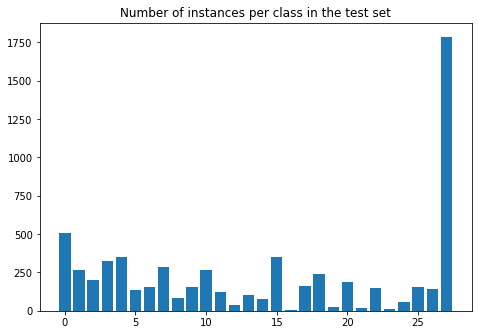

In [ ]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.set_title('Number of instances per class in the test set')
metric_name = "total"
ax.bar(list(label2index.values()), [x[metric_name] for x in list(cls_report.values())])
plt.show()

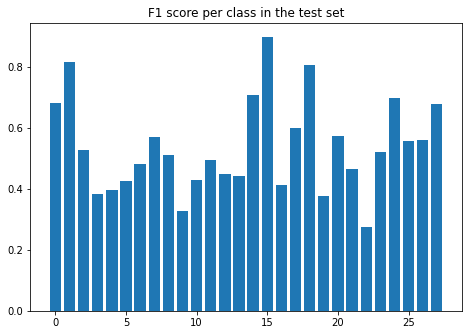

In [ ]:
# make two columns
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.set_title('F1 score per class in the test set')
metric_name = "f1"
ax.bar(list(label2index.values()), [x[metric_name] for x in list(cls_report.values())])
plt.show()

In [ ]:
ground_truths_flattened = []
for g in ground_truths:
    ground_truths_flattened += g

In [ ]:
ground_truths_flattened_idx = [label2index[lab] for lab in ground_truths_flattened]

In [ ]:
s = pd.Series(ground_truths_flattened_idx)
vc = s.value_counts().sort_index()
vc

0      4130
1      2328
2      1567
3      2470
4      2939
5      1087
6      1368
7      2191
8       641
9      1269
10     2022
11      793
12      303
13      853
14      596
15     2662
16       77
17     1452
18     2086
19      164
20     1581
21      111
22     1110
23      153
24      545
25     1326
26     1060
27    14219
dtype: int64

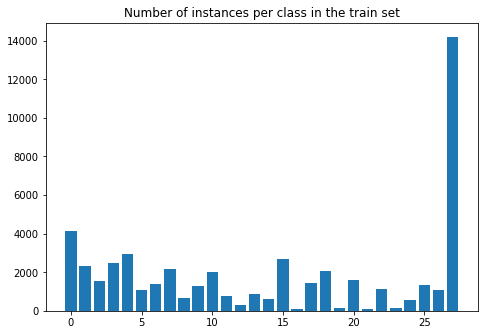

In [ ]:
# make two columns
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.set_title('Number of instances per class in the train set')
ax.bar(list(vc.index), vc.to_list())
plt.show()

## F1 plot

In [ ]:
macro_f1_1000 = 0.07030930424076505
macro_f1_10000 = 0.4929084923267342
macro_f1_11000 = 0.4805965771147748
macro_f1_12000 = 0.48715972633058163
macro_f1_13000 = 0.4814815173563919
macro_f1_14000 = 0.4827323726672562
macro_f1_15000 = 0.4770365276145491
macro_f1_16000 = 0.4857838747955626
macro_f1_17000 = 0.4914166938847799
macro_f1_18000 = 0.48469963107630054
macro_f1_19000 = 0.48653950104616656
macro_f1_2000 = 0.2352734464898298
macro_f1_20000 = 0.48884462765697806
macro_f1_21000 = 0.4966320049847735
macro_f1_22000 = 0.4971545779966883
macro_f1_23000 = 0.49908513760449746
macro_f1_24000 = 0.5064748897424308
macro_f1_25000 = 0.5011835278086442
macro_f1_26000 = 0.5025184431794665
macro_f1_27000 = 0.5030073070154714
macro_f1_3000 = 0.3524151509086527
macro_f1_4000 = 0.43475007615892586
macro_f1_5000 = 0.45048547671253664
macro_f1_6000 = 0.4590564089660823
macro_f1_7000 = 0.4629969898921404
macro_f1_8000 = 0.47284343942763607
macro_f1_9000 = 0.48038152258069483

f1_original = [macro_f1_1000, macro_f1_2000, macro_f1_3000, macro_f1_4000, macro_f1_5000, macro_f1_6000, macro_f1_7000, macro_f1_8000, macro_f1_9000, macro_f1_10000,
               macro_f1_11000, macro_f1_12000, macro_f1_13000, macro_f1_14000, macro_f1_15000, macro_f1_16000, macro_f1_17000, macro_f1_18000, macro_f1_19000, macro_f1_20000,
               macro_f1_21000, macro_f1_22000, macro_f1_23000, macro_f1_24000, macro_f1_25000, macro_f1_26000, macro_f1_27000
               ]

macro_f1_1000 = 0.05951949104957526
macro_f1_10000 = 0.4638171374781819
macro_f1_11000 = 0.4988148117019347
macro_f1_12000 = 0.49026261497477414
macro_f1_13000 = 0.4827062840976132
macro_f1_14000 = 0.4975662778617754
macro_f1_15000 = 0.48621662345489947
macro_f1_16000 = 0.4893647806034453
macro_f1_17000 = 0.4988479489466922
macro_f1_18000 = 0.4985191787049471
macro_f1_19000 = 0.4932606528229874
macro_f1_2000 = 0.23196853845586182
macro_f1_20000 = 0.49885228020130473
macro_f1_21000 = 0.49898314383112596
macro_f1_22000 = 0.5000635647468442
macro_f1_23000 = 0.5097809181341952
macro_f1_24000 = 0.4963355477088029
macro_f1_25000 = 0.499232868191008
macro_f1_26000 = 0.5019333798699205
macro_f1_27000 = 0.5064245880230415
macro_f1_3000 = 0.37749811272006356
macro_f1_4000 = 0.417747686182304
macro_f1_5000 = 0.42724837357702844
macro_f1_6000 = 0.4403789344813406
macro_f1_7000 = 0.46552476773979606
macro_f1_8000 = 0.47563487430868145
macro_f1_9000 = 0.4693572288152653

f1_aux_ekman = [macro_f1_1000, macro_f1_2000, macro_f1_3000, macro_f1_4000, macro_f1_5000, macro_f1_6000, macro_f1_7000, macro_f1_8000, macro_f1_9000, macro_f1_10000,
               macro_f1_11000, macro_f1_12000, macro_f1_13000, macro_f1_14000, macro_f1_15000, macro_f1_16000, macro_f1_17000, macro_f1_18000, macro_f1_19000, macro_f1_20000,
               macro_f1_21000, macro_f1_22000, macro_f1_23000, macro_f1_24000, macro_f1_25000, macro_f1_26000, macro_f1_27000
               ]

macro_f1_1000 = 0.05178996320700536
macro_f1_10000 = 0.46900316220383476
macro_f1_11000 = 0.48093034188542305
macro_f1_12000 = 0.4762701734280523
macro_f1_13000 = 0.490556384080279
macro_f1_14000 = 0.47229367263039446
macro_f1_15000 = 0.48888537934052934
macro_f1_16000 = 0.47900631866558113
macro_f1_17000 = 0.4879859215962758
macro_f1_18000 = 0.4999340615710502
macro_f1_19000 = 0.500203850152035
macro_f1_2000 = 0.19836756162192537
macro_f1_20000 = 0.49612831818612324
macro_f1_21000 = 0.5128870175188676
macro_f1_22000 = 0.50501443754555
macro_f1_23000 = 0.5037543214714378
macro_f1_24000 = 0.49504792129467207
macro_f1_25000 = 0.5117631869302208
macro_f1_26000 = 0.5074164750009197
macro_f1_27000 = 0.50213821007717
macro_f1_3000 = 0.3486431959831696
macro_f1_4000 = 0.4104627328194392
macro_f1_5000 = 0.4350488637502466
macro_f1_6000 = 0.43596005589366804
macro_f1_7000 = 0.4549067017918927
macro_f1_8000 = 0.46422044554210756
macro_f1_9000 = 0.45815359240811476

f1_aux_group = [macro_f1_1000, macro_f1_2000, macro_f1_3000, macro_f1_4000, macro_f1_5000, macro_f1_6000, macro_f1_7000, macro_f1_8000, macro_f1_9000, macro_f1_10000,
               macro_f1_11000, macro_f1_12000, macro_f1_13000, macro_f1_14000, macro_f1_15000, macro_f1_16000, macro_f1_17000, macro_f1_18000, macro_f1_19000, macro_f1_20000,
               macro_f1_21000, macro_f1_22000, macro_f1_23000, macro_f1_24000, macro_f1_25000, macro_f1_26000, macro_f1_27000
               ]

macro_f1_1000 = 0.4206055815478521
macro_f1_10000 = 0.5155939371789007
macro_f1_11000 = 0.5177996873221212
macro_f1_12000 = 0.4915699836966388
macro_f1_13000 = 0.4842508402013722
macro_f1_14000 = 0.4972038924295873
macro_f1_15000 = 0.5084273965594386
macro_f1_16000 = 0.49623013390914517
macro_f1_17000 = 0.4854178674245446
macro_f1_18000 = 0.4809176721361004
macro_f1_19000 = 0.4850020894467633
macro_f1_2000 = 0.4694805319298793
macro_f1_20000 = 0.4863754433914286
macro_f1_21000 = 0.48383403737625397
macro_f1_22000 = 0.48715515135438786
macro_f1_23000 = 0.4862765624571907
macro_f1_24000 = 0.49405753500208327
macro_f1_25000 = 0.48912422572808323
macro_f1_26000 = 0.4891133876197421
macro_f1_27000 = 0.49377375956496167
macro_f1_3000 = 0.48170582918193905
macro_f1_4000 = 0.501904225869319
macro_f1_5000 = 0.5203495302905253
macro_f1_6000 = 0.5234994569558616
macro_f1_7000 = 0.5298234395379657
macro_f1_8000 = 0.5219275839707432
macro_f1_9000 = 0.5134893899201575

f1_emb_aux = [macro_f1_1000, macro_f1_2000, macro_f1_3000, macro_f1_4000, macro_f1_5000, macro_f1_6000, macro_f1_7000, macro_f1_8000, macro_f1_9000, macro_f1_10000,
               macro_f1_11000, macro_f1_12000, macro_f1_13000, macro_f1_14000, macro_f1_15000, macro_f1_16000, macro_f1_17000, macro_f1_18000, macro_f1_19000, macro_f1_20000,
               macro_f1_21000, macro_f1_22000, macro_f1_23000, macro_f1_24000, macro_f1_25000, macro_f1_26000, macro_f1_27000
               ]

macro_f1_1000 = 0.4594549507167663
macro_f1_10000 = 0.5171314400038002
macro_f1_11000 = 0.5052143438979413
macro_f1_12000 = 0.5093552300547427
macro_f1_13000 = 0.5074939712077234
macro_f1_14000 = 0.5085351416271616
macro_f1_15000 = 0.500881990650161
macro_f1_16000 = 0.5121243379488336
macro_f1_17000 = 0.48841058252421565
macro_f1_18000 = 0.50184091932247
macro_f1_19000 = 0.5026291561425905
macro_f1_2000 = 0.4715010692363123
macro_f1_20000 = 0.49909624091787963
macro_f1_21000 = 0.5029274520113148
macro_f1_22000 = 0.5093679969983624
macro_f1_23000 = 0.5018831517689069
macro_f1_24000 = 0.5080806570775055
macro_f1_25000 = 0.5062047512480132
macro_f1_26000 = 0.5051300017229309
macro_f1_27000 = 0.5062506752252098
macro_f1_3000 = 0.48543840109058456
macro_f1_4000 = 0.5064852461981647
macro_f1_5000 = 0.5228137213783074
macro_f1_6000 = 0.5171358978789434
macro_f1_7000 = 0.519648275112371
macro_f1_8000 = 0.5375160186126732
macro_f1_9000 = 0.5140114593796566

f1_emb = [macro_f1_1000, macro_f1_2000, macro_f1_3000, macro_f1_4000, macro_f1_5000, macro_f1_6000, macro_f1_7000, macro_f1_8000, macro_f1_9000, macro_f1_10000,
               macro_f1_11000, macro_f1_12000, macro_f1_13000, macro_f1_14000, macro_f1_15000, macro_f1_16000, macro_f1_17000, macro_f1_18000, macro_f1_19000, macro_f1_20000,
               macro_f1_21000, macro_f1_22000, macro_f1_23000, macro_f1_24000, macro_f1_25000, macro_f1_26000, macro_f1_27000
               ]

In [ ]:
df = pd.DataFrame({
    'baseline': f1_original,
    'aux_ekman': f1_aux_ekman,
    'aux_group': f1_aux_group,
    'label_emb-aux': f1_emb_aux,
    'label_emb': f1_emb
})

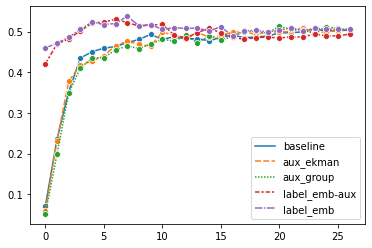

In [ ]:
sns.lineplot(data=df)

Text(0, 0.5, 'Macro F1')

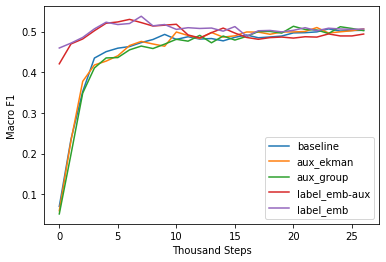

In [ ]:
ax = df.plot()
ax.set_xlabel("Thousand Steps")
ax.set_ylabel("Macro F1")